In [1]:
%load_ext autoreload
%autoreload 2
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
from torch.utils.data import Dataset
import csv
from PIL import Image
import re
#from torchsummary import summary

cudnn.benchmark = True
plt.ion()



e:\UDL Project\ad-venv\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Dataset

In [2]:
class CustomDataset(Dataset):
    def __init__(self, path, transform=None):
        super().__init__()
        self.transform = transform
        self.main_dir = os.path.join(path)
        self.all_imgs = sorted(os.listdir(self.main_dir), key=lambda s: int(re.search(r'\d+', s).group()))
        
    def __len__(self):
        return len(self.all_imgs)
    
    def __getitem__(self, idx):
        img_loc = os.path.join(self.main_dir, self.all_imgs[idx])
        image = Image.open(img_loc).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image

Device

In [3]:
#apple
#device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
#windows
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


Load Data

In [4]:

data_transforms =  transforms.Compose([
        transforms.Resize((512,512)),
        transforms.ToTensor(),
    ])
directory = os.getcwd()
data_dir = r"E:\UDL Project\anomaly-detection\data\capsule\train\good"
train_dataset = CustomDataset(data_dir,data_transforms)
test_dataset = CustomDataset(r"E:\UDL Project\anomaly-detection\data\capsule\test\crack",data_transforms)

train_dataset, val_dataset = torch.utils.data.random_split(train_dataset, [0.8, 0.2])
train_dataloader =  torch.utils.data.DataLoader(train_dataset, batch_size=2,
                                             shuffle=False, num_workers=0)

val_dataloader =  torch.utils.data.DataLoader(val_dataset, batch_size=2,
                                             shuffle=False, num_workers=0)
test_dataloader =  torch.utils.data.DataLoader(test_dataset, batch_size=2,
                                             shuffle=False, num_workers=0)

print(len(train_dataloader),len(val_dataloader))

88 22


View Data

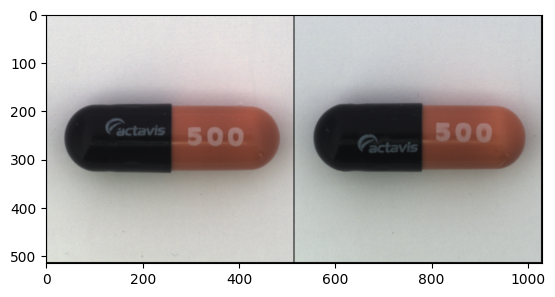

In [5]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of  data
inputs = next(iter(train_dataloader))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out)

Datasets & DataLoaders

In [6]:
image_datasets = {'train': train_dataset }
dataloaders = {'train': train_dataloader}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train']}


Encoder

In [7]:
class AutoEncoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.Conv2d(8, 16, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.Conv2d(16, 32, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.Flatten(),
            nn.Linear(256*13*13,3)
        )    
        
        self.decoder = nn.Sequential(
            nn.Linear(3, 256*13*13),
            nn.ReLU(True),
            nn.Unflatten(dim=1, unflattened_size=(256, 13, 13)),
            nn.ConvTranspose2d(256, 128, 4, 1, 0, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 3, 4, 2, 1, bias=False),
            nn.ReLU(True)
        )
        
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x
    
    def encode(self, x):
        x = self.encoder(x)
        return x
    

In [8]:
testModel = AutoEncoder()
#summary(testModel, (3, 512, 512),4)


Model, Loss & Optimizer

In [9]:
torch.manual_seed(0)

loss = torch.nn.MSELoss()
lr= 0.0001
num_epochs = 30

model = AutoEncoder()
optim = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-05)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, T_max=num_epochs * len(train_dataloader),
      eta_min= 1e-6/lr)

model.to(device)

AutoEncoder(
  (encoder): Sequential(
    (0): Conv2d(3, 8, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(8, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=

Train

In [10]:
def train_epoch(model, device, dataloader, loss_fn, optimizer):

    model.train()
    train_loss = []
    for image_batch in dataloader: 
        image_batch = image_batch.to(device)
        decoded_data = model(image_batch)
        loss = loss_fn(decoded_data, image_batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        scheduler.step()
        #print('\t partial train loss (single batch): %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

Validation Test

In [11]:
def test_epoch(model, device, dataloader, loss_fn):
    model.eval()
    with torch.no_grad():
        conc_out = []
        conc_label = []
        for image_batch in dataloader:
            image_batch = image_batch.to(device)
            decoded_data = model(image_batch)
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

Plot Output

In [12]:
def plot_ae_outputs(model,n=10):
  inputs = next(iter(val_dataloader))
  out = torchvision.utils.make_grid(inputs)
  imshow(out)
  img = inputs.to(device)
  model.eval()
  with torch.no_grad():
      rec_img  = model(img)
  rec_img = rec_img.cpu()
  rec_out =  torchvision.utils.make_grid(rec_img)
  imshow(rec_out)

Training


 EPOCH 1/30 	 train loss 0.3088921010494232 	 val loss 0.23226197063922882


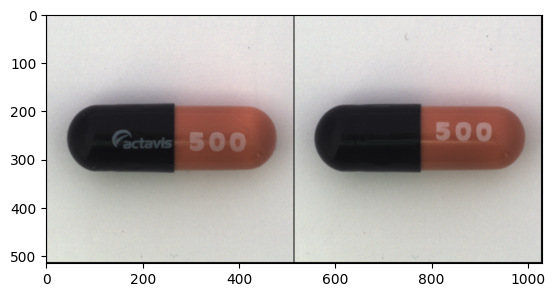

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


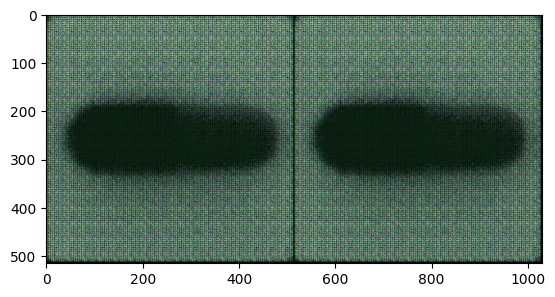


 EPOCH 2/30 	 train loss 0.1984996795654297 	 val loss 0.12575918436050415


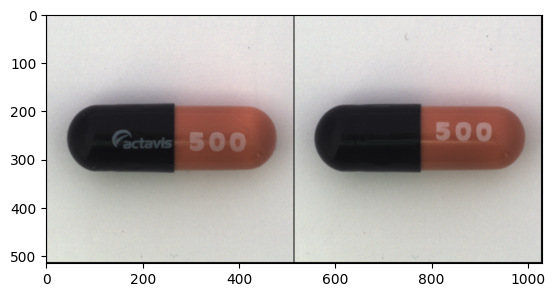

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


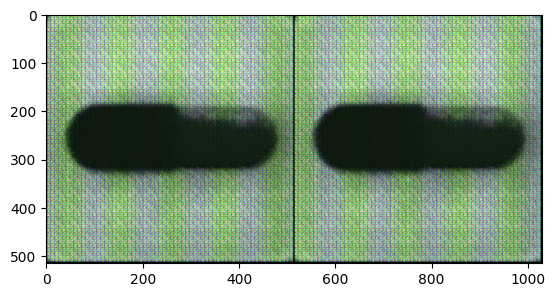


 EPOCH 3/30 	 train loss 0.07553315907716751 	 val loss 0.032443299889564514


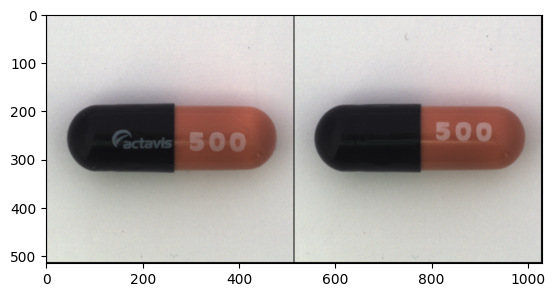

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


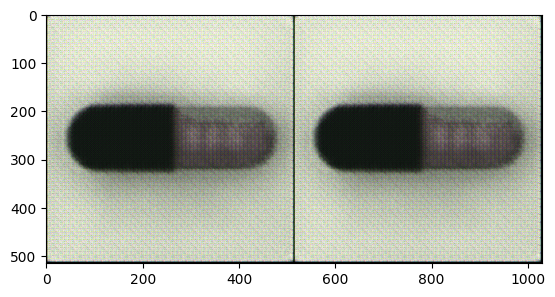


 EPOCH 4/30 	 train loss 0.01859775371849537 	 val loss 0.00879277940839529


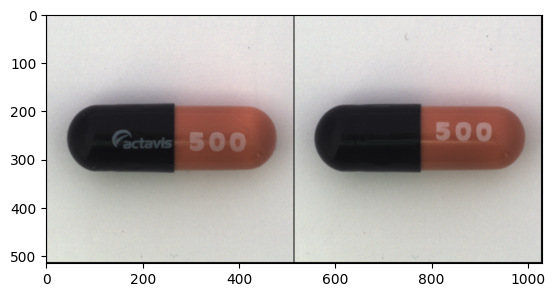

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


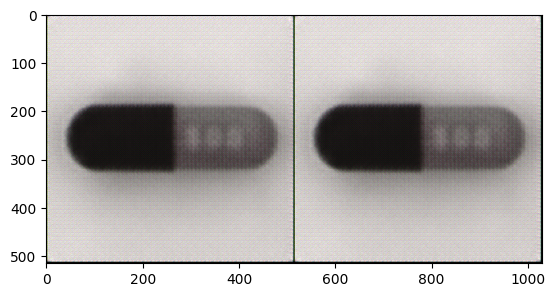


 EPOCH 5/30 	 train loss 0.006104782223701477 	 val loss 0.005629914812743664


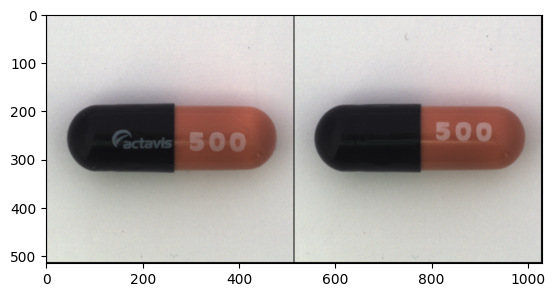

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


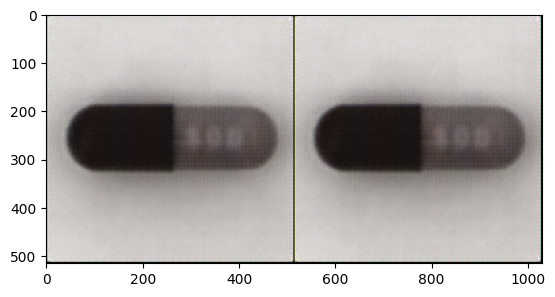


 EPOCH 6/30 	 train loss 0.004040034022182226 	 val loss 0.0044303457252681255


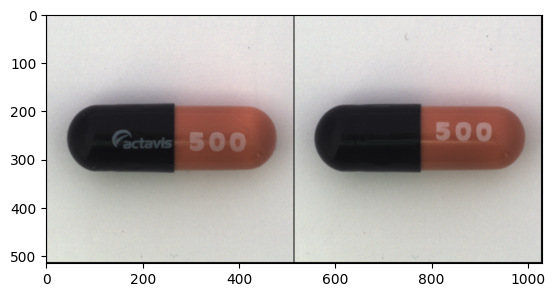

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


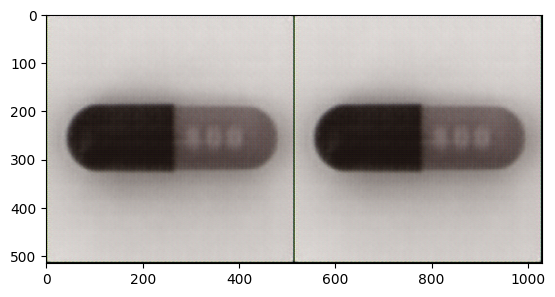


 EPOCH 7/30 	 train loss 0.003394907573238015 	 val loss 0.00298409815877676


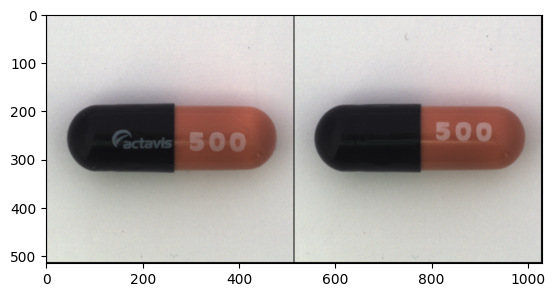

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


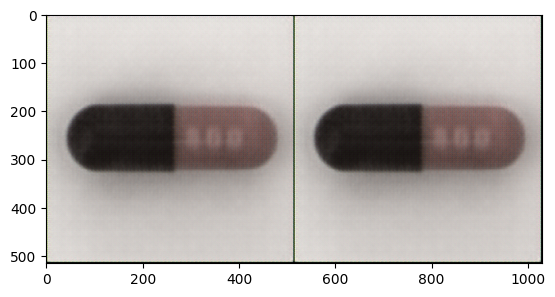


 EPOCH 8/30 	 train loss 0.002722844248637557 	 val loss 0.0024899127893149853


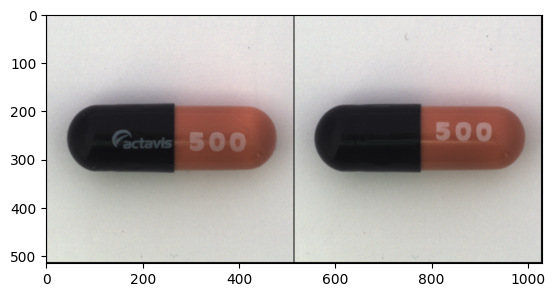

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


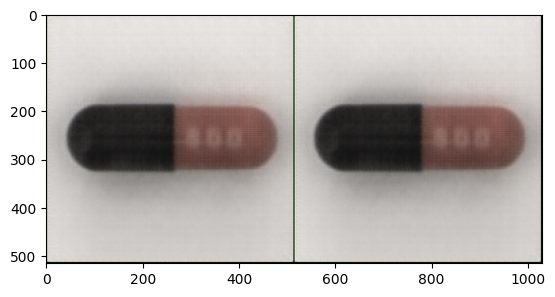


 EPOCH 9/30 	 train loss 0.002258863067254424 	 val loss 0.0017305818619206548


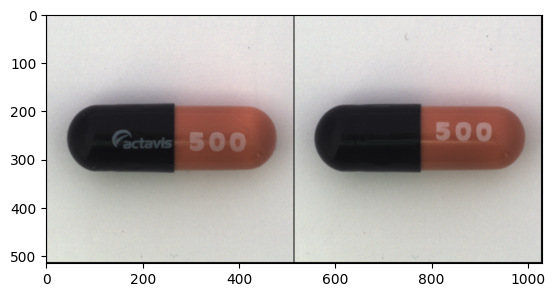

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


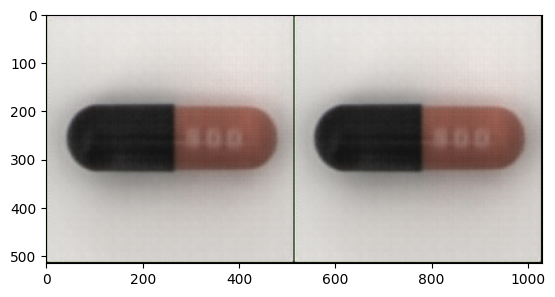


 EPOCH 10/30 	 train loss 0.0018752176547423005 	 val loss 0.0024678742047399282


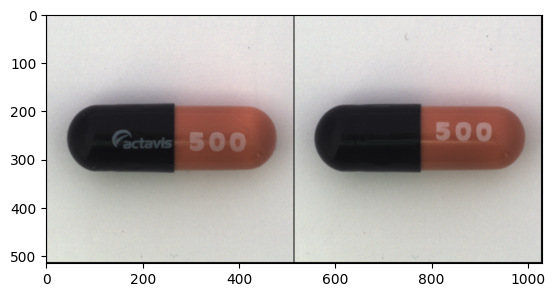

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


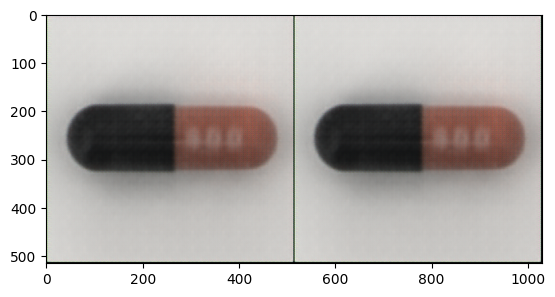


 EPOCH 11/30 	 train loss 0.001592840999364853 	 val loss 0.004839467350393534


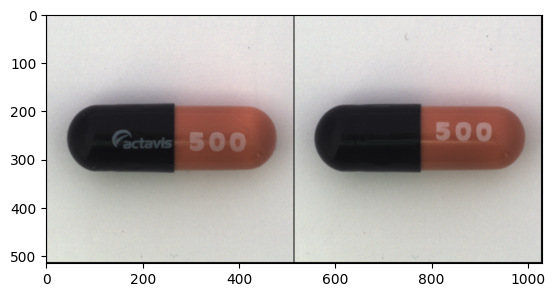

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


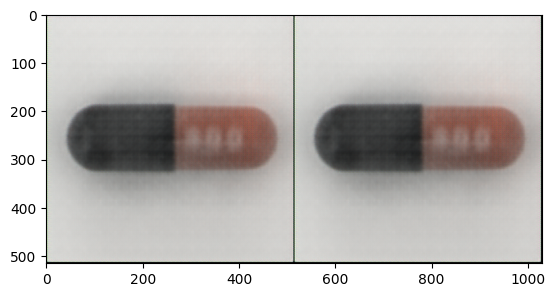


 EPOCH 12/30 	 train loss 0.0014867029385641217 	 val loss 0.0011733119608834386


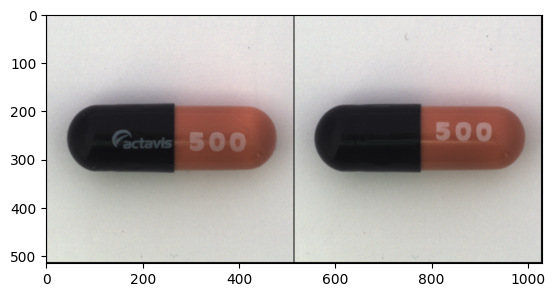

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


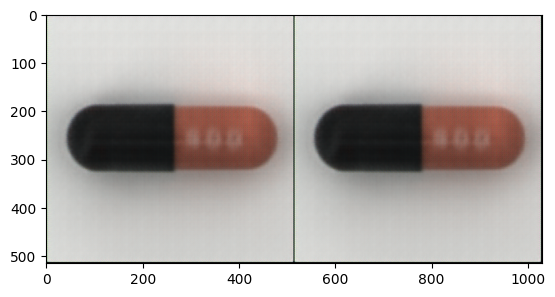


 EPOCH 13/30 	 train loss 0.001308608683757484 	 val loss 0.011277886107563972


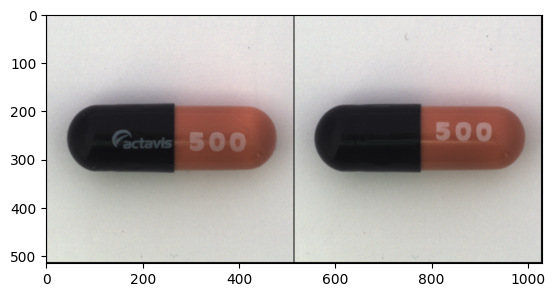

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


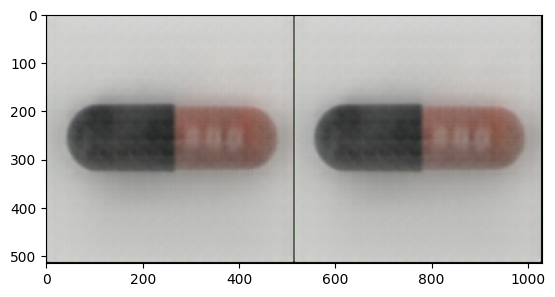


 EPOCH 14/30 	 train loss 0.0013065997045487165 	 val loss 0.003312273183837533


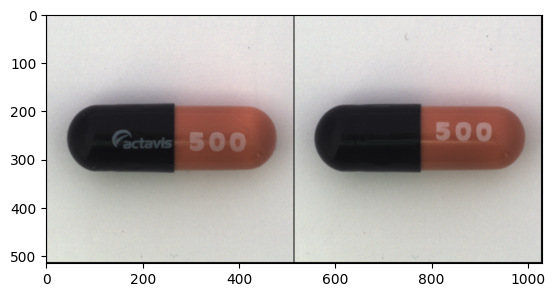

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


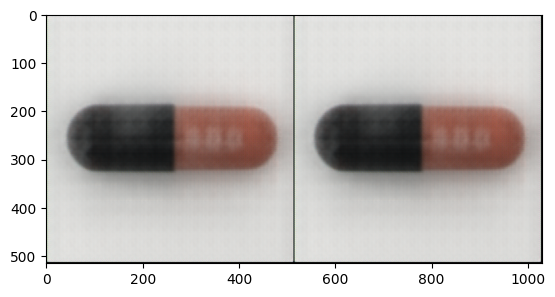


 EPOCH 15/30 	 train loss 0.0045948270708322525 	 val loss 0.04158337786793709


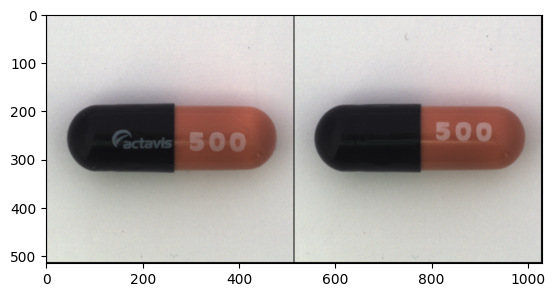

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


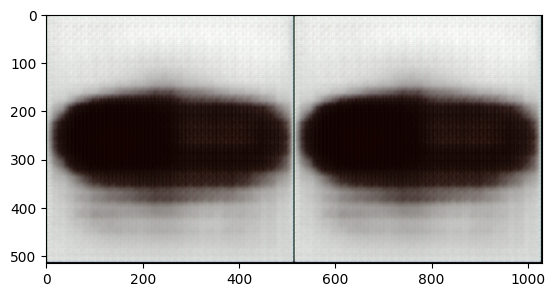


 EPOCH 16/30 	 train loss 0.0024475420359522104 	 val loss 0.003972383216023445


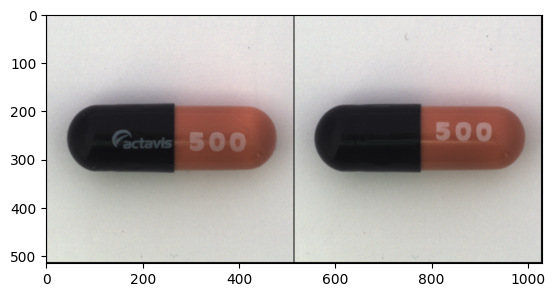

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


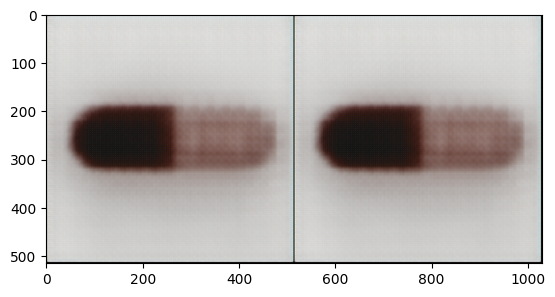


 EPOCH 17/30 	 train loss 0.0015969303203746676 	 val loss 0.0019298178376629949


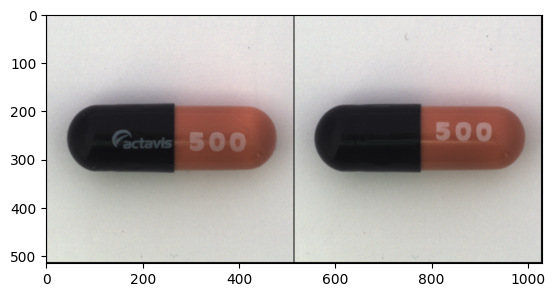

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


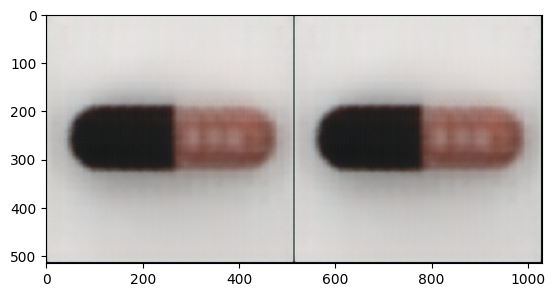


 EPOCH 18/30 	 train loss 0.001290143234655261 	 val loss 0.0010247862664982677


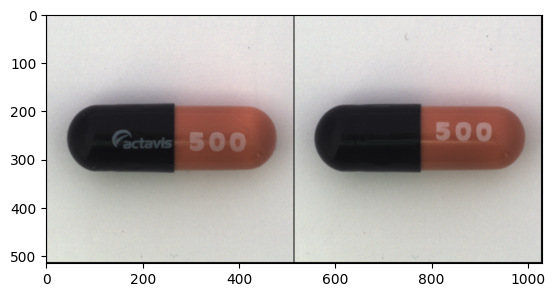

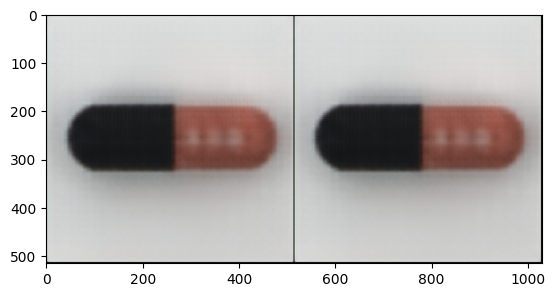


 EPOCH 19/30 	 train loss 0.0011928750900551677 	 val loss 0.0010507226688787341


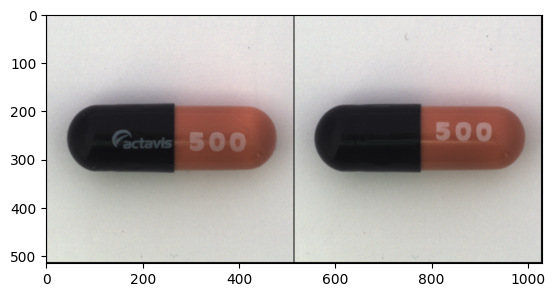

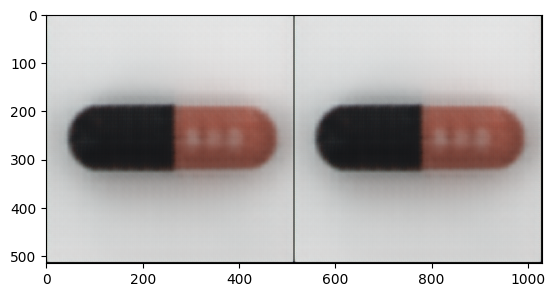


 EPOCH 20/30 	 train loss 0.0011672034161165357 	 val loss 0.0008350782445631921


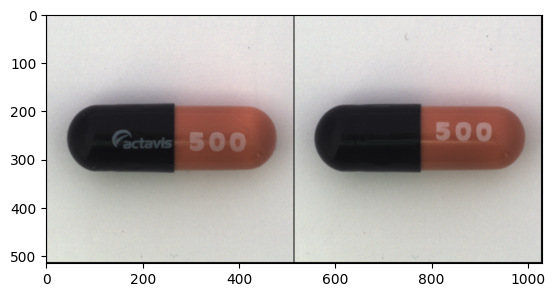

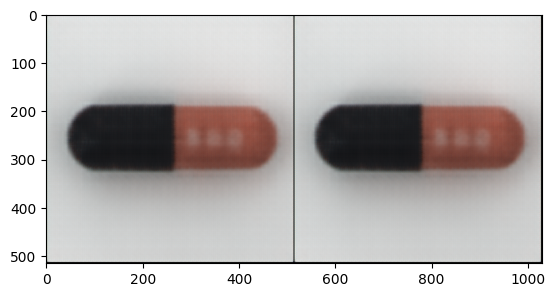


 EPOCH 21/30 	 train loss 0.0011394703760743141 	 val loss 0.0008192642126232386


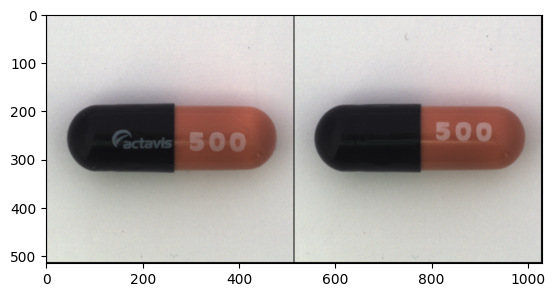

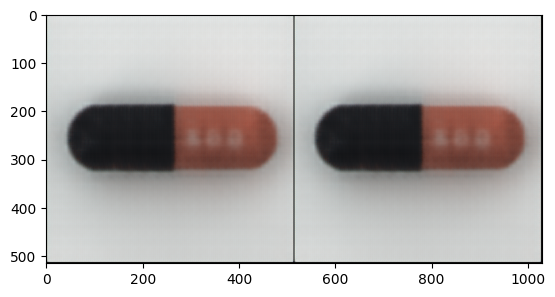


 EPOCH 22/30 	 train loss 0.0011403750395402312 	 val loss 0.001033511245623231


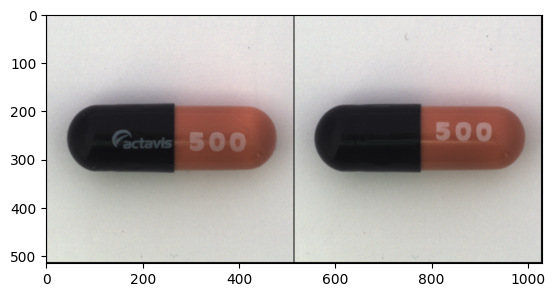

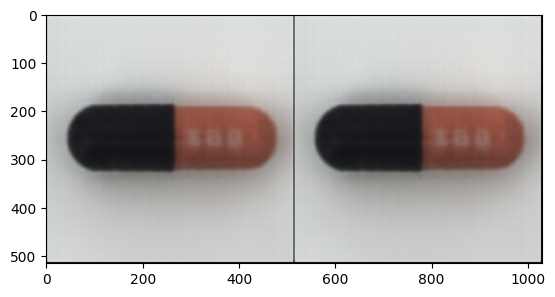


 EPOCH 23/30 	 train loss 0.0011412418680265546 	 val loss 0.002633125986903906


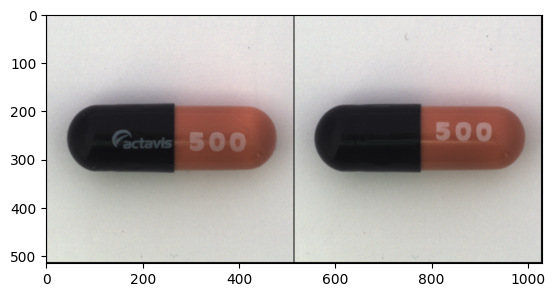

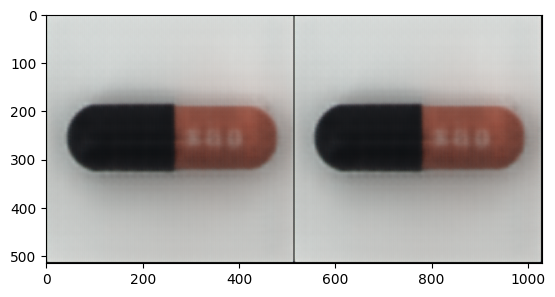


 EPOCH 24/30 	 train loss 0.0011722850613296032 	 val loss 0.000852943048812449


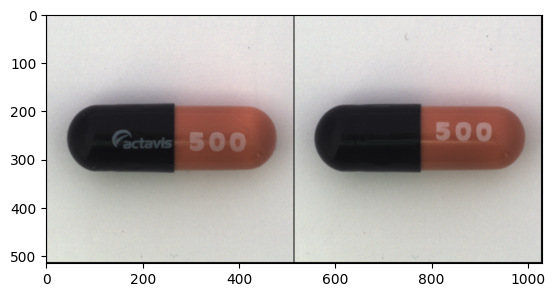

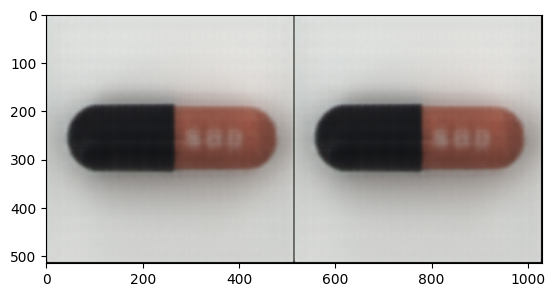


 EPOCH 25/30 	 train loss 0.0011693206615746021 	 val loss 0.001058208174072206


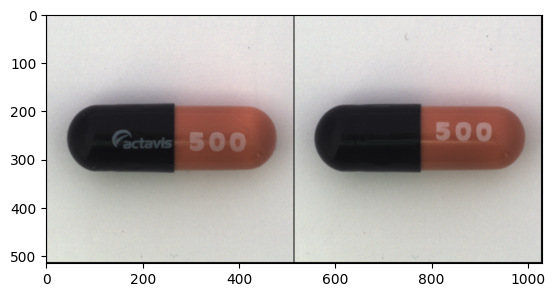

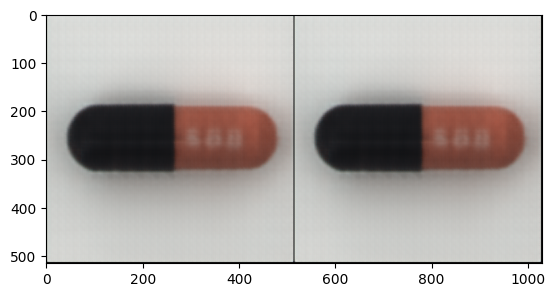


 EPOCH 26/30 	 train loss 0.0011752743739634752 	 val loss 0.0014871297171339393


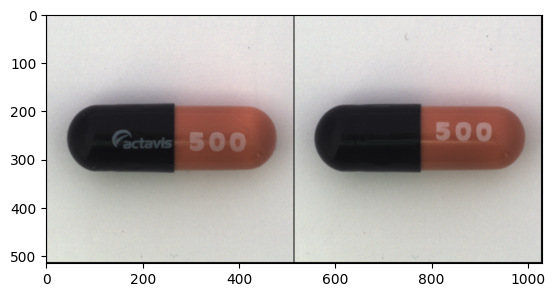

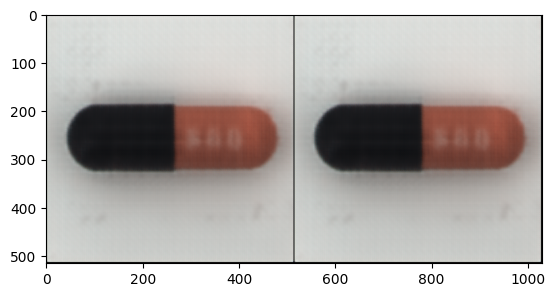


 EPOCH 27/30 	 train loss 0.0011807905975729227 	 val loss 0.0009233758319169283


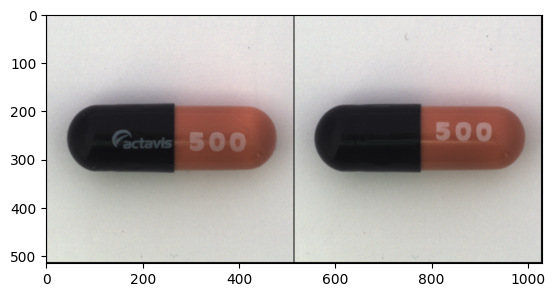

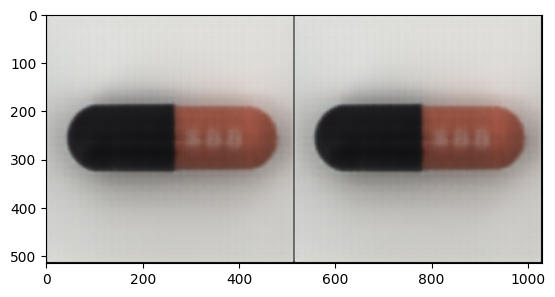


 EPOCH 28/30 	 train loss 0.001219080644659698 	 val loss 0.0027181527111679316


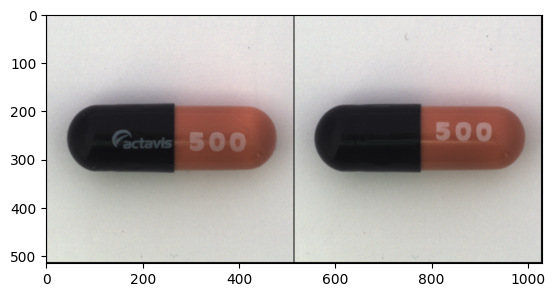

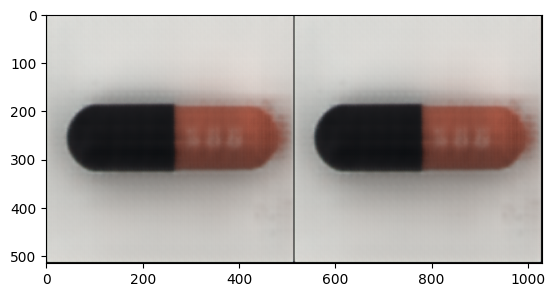


 EPOCH 29/30 	 train loss 0.0012224218808114529 	 val loss 0.0007362023461610079


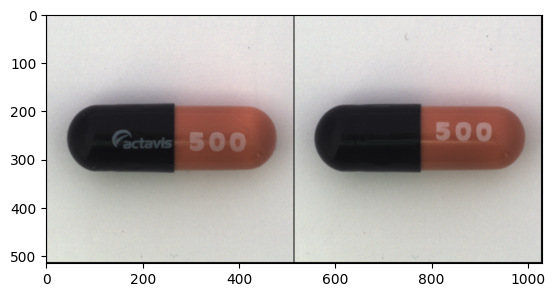

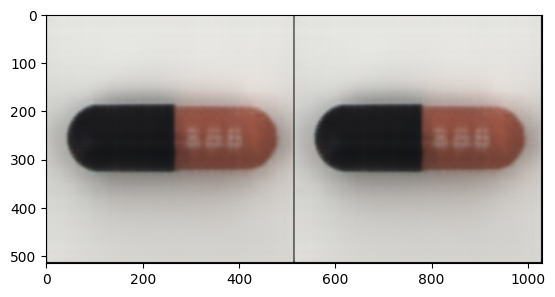

RuntimeError: [enforce fail at ..\c10\core\impl\alloc_cpu.cpp:72] data. DefaultCPUAllocator: not enough memory: you tried to allocate 135266304 bytes.

In [13]:

diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
   train_loss =train_epoch(model,device,train_dataloader,loss,optim)
   val_loss = test_epoch(model,device,val_dataloader,loss)
   print('\n EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss,val_loss))
   diz_loss['train_loss'].append(train_loss)
   diz_loss['val_loss'].append(val_loss)
   plot_ae_outputs(model,n=10)

Plot Validation loss vs Train Loss

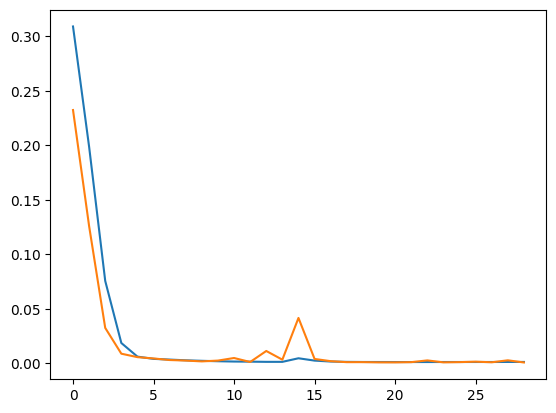

In [14]:
plt.plot(diz_loss['train_loss'])
plt.plot(diz_loss['val_loss'])
plt.show()


Temp Section do not delete

torch.Size([2, 3, 512, 512])


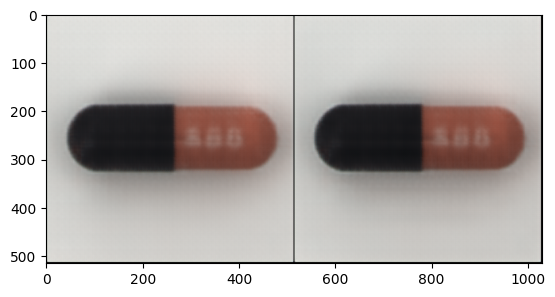

In [15]:
inputs = next(iter(train_dataloader))
inputs = inputs.to(device)
out = model(inputs)
print(out.shape)
out = out.cpu()
out = torchvision.utils.make_grid(out)
out =  out.detach()
imshow(out)

Latent Representation

In [ ]:
train = []
val = []
test = []
data = []
with torch.no_grad():
        for image_batch in train_dataloader:
            image_batch = image_batch.to(device)
            decoded_data = model.encode(image_batch)
            train.append(decoded_data.cpu())
            data.append(decoded_data.cpu())
        for image_batch in val_dataloader:
            image_batch = image_batch.to(device)
            decoded_data = model.encode(image_batch)
            val.append(decoded_data.cpu())
            data.append(decoded_data.cpu())
        for image_batch in test_dataloader:
            image_batch = image_batch.to(device)
            decoded_data = model.encode(image_batch)
            test.append(decoded_data.cpu())
            data.append(decoded_data.cpu())
        train = torch.cat(train)
        val = torch.cat(val)
        test = torch.cat(test)
        data = torch.cat(data)
torch.set_printoptions(threshold=10_000)

Clustering


In [ ]:
from sklearn import cluster
kmeans = cluster.KMeans(init='k-means++',n_clusters=3).fit(data)

labels = kmeans.labels_
print(labels)
centroids = kmeans.cluster_centers_
print(centroids)
u_labels = np.unique(labels)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
for i in u_labels:
    ax.scatter(data[labels == i , 0] , data[labels == i , 1], data[labels == i , 2] , label = i)

ax.scatter(centroids[:,0] , centroids[:,1] , centroids[:,2], color = 'k')
plt.legend()
plt.show()

In [ ]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter(train[:, 0], train[:, 1],cmap='hot')
ax.scatter(val[:, 0], val[:, 1],c='#FFA500', cmap='hot')
ax.scatter(test[:, 0], test[:, 1],c='#00FF00', cmap='hot')

# Display the plot
plt.show()

In [ ]:
with torch.no_grad():
        conc_out = []
        for image_batch in val_dataloader:
            image_batch = image_batch.to(device)
            decoded_data = model.encode(image_batch)
            conc_out.append(decoded_data.cpu())
        conc_out = torch.cat(conc_out)
print(conc_out)